# First exploration of a patents dump

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
# from langdetect import detect as detect_language
from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets

### Our dataset

We collected our dataset thanks to the EPO interface that enables to query their database using SQL. We select only patents that were applied in Switzerland and where the abstract is in english.

```sql
SELECT A.appln_id , A.appln_abstract, B.appln_filing_year
FROM tls203_appln_abstr as A, tls201_appln as B
WHERE (A.appln_id = B.appln_id AND B.appln_auth = 'CH' AND A.appln_abstract_lg = 'en')
```

In [25]:
data = pd.read_csv("../data/patentsCH_EN.csv", sep=";",
                  index_col=0,
                  names=["id", "abstract", "year"])[1:]

In [29]:
data.describe()

,abstract,year
count,56611,56611
unique,54804,62
top,2-(6-methoxy-2-naphthyl)propionic acid (I) is ...,1975
freq,17,2695


In [30]:
data.index.is_unique, data.set_index(["abstract", "year"]).index.is_unique

(True, False)

Although the ID is unique, there exist some patents with same (abstract, year) tuples. We don't really want that : for our final visualization, that'll only duplicate some points and give a skewed vision of topics. We decide to remove them.

In [31]:
data = data.drop_duplicates()

In [32]:
data.describe()

,abstract,year
count,55165,55165
unique,54804,62
top,"CNS-active 1-subst. 1,4-benzodiazepin-2-ones. ...",1975
freq,3,2659


## (don't run) NLP Pre processing

Below are some utils for NLP methods

In [33]:
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import re
import stop_words
import string
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()
from nltk.corpus import wordnet

def get_wordnet_tag(treebank_tag):
    """ enables to map pos tags from treebank to wordnet valid pos tags 
    (in order to feed the lemmatizer) """
    
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:  # if starts with N or others (noun by default)
        return wordnet.NOUN
    
def lemmatize(token):
    """ final method to lemmatize using wordnet lemmatizer """
    
    trbk_tag = pos_tag([token])[0][1]  # get the treebank tag from pos_tag method
    wrdnt_tag = get_wordnet_tag(treebank_tag=trbk_tag)  # translate it to wordnet tag
    return lemmatizer.lemmatize(token, wrdnt_tag)

stop_words_ = stop_words.get_stop_words("en")
punctuation_filter = str.maketrans({key: None for key in string.punctuation})

def nlp_pre_process(text, lemma=True, stem=False):
    """
    Reduces an input text into a list of tokens, 
    using NLP filterings such as normalization, 
    PoS and stop word filtering, stemming.
    text: (str)
    tokens: list(str)
    """
    text = text.lower()  # normalize
    text = text.translate(punctuation_filter)  # remove punctuation
    tokens = word_tokenize(text)  # tokenize
    pos_tags = [pos_tag([t]) for t in tokens]  # PoS tagging
    tokens = [token for [(token, tag)] in pos_tags if tag != "DT"]  # PoS filtering
    tokens = [t for t in tokens if t not in stop_words_]  # stop words filtering
    
    if stem:
        tokens = [stemmer.stem(t) for t in tokens]  # stemming
    
    if lemma:
        tokens = [lemmatize(t) for t in tokens]  # lemmatizing
    
    return " ".join(tokens)

We apply this NLP pipeline to all the abstracts we have.

In [34]:
#data.abstract = data.abstract.apply(nlp_pre_process)

And save it. It is heavy computation, better not run it everytime.

In [35]:
#data.to_csv("../data/patentsCH_EN_preprocessed.csv")

# Import pre-processed patents abstracts

In [2]:
data = pd.read_csv("../data/patentsCH_EN_preprocessed.csv")

In [3]:
data.head()

,id,abstract,year
0,6458882,cpd formula antitussive analgesic intermediate...,1965
1,6465428,safety syringe comprises cylinder 10 throughbo...,2006
2,6467440,kit seal aperture rim 6 tubeless tire comprise...,2001
3,6467981,organoleptic prop tobacco prod improve modify ...,1971
4,6468448,nail shank 2 circular crosssection slightly cu...,2000


# Keeping only a random subset

In [25]:
print("There are ", len(data), " english abstracts")

There are  55165  english abstracts


In [26]:
data.year.describe()

count    55165.000000
mean      1987.650249
std         77.516254
min       1955.000000
25%       1975.000000
50%       1984.000000
75%       1999.000000
max       9999.000000
Name: year, dtype: float64

Number of patents per year

We should remove data from year 9999...

In [27]:
data = data[data.year <= 2018]

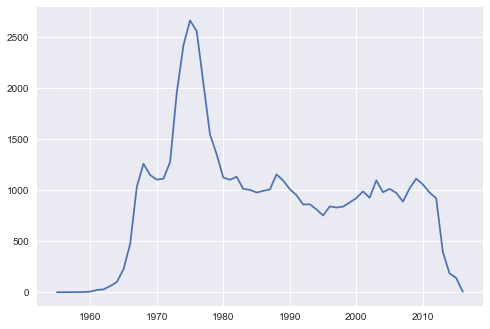

In [28]:
plt.plot(list(set(data.year.values)), data.groupby("year").abstract.count().values)

We decide to choose randomly `N_RANDOM` of them for computation issues.

In [29]:
N_RANDOM = 25000

Let's select them

In [30]:
import random

In [31]:
random.seed(777)
a = range(len(data))
b = random.sample(a, N_RANDOM)

In [32]:
data_en = data.iloc[b]

In [33]:
print("Our data is now of length ", len(data_en))

Our data is now of length  25000


In [34]:
data_en.abstract.head()

15034    broadspectrum antibiotic prepared combine broa...
29223    main patent propose device spring element supp...
29207    invention proposes follow method produce react...
24161    invention concern large compost plant new comp...
37721    novel programmable switch data storage element...
Name: abstract, dtype: object

In [35]:
data_en.to_csv("final_data_en.csv")

In [49]:
data_en = data_en.reset_index()
data_en = data_en.set_index("year")[["abstract"]]
data_en.head()

,abstract
year,
1967,broadspectrum antibiotic prepared combine broa...
1976,main patent propose device spring element supp...
1993,invention proposes follow method produce react...
1990,invention concern large compost plant new comp...
1989,novel programmable switch data storage element...


Our english data is ready

# -------------- TOPIC EXTRACTION --------------

## If problem with textmining package : http://stackoverflow.com/questions/15717752/python3-3-importerror-with-textmining-1-0

In [50]:
%matplotlib inline
from textmining import TermDocumentMatrix
import numpy as np
import lda
from sklearn.manifold import TSNE
import seaborn as sns
import logging
import json
logging.getLogger("lda").setLevel(logging.WARNING)  # disable INFOs output from lda

ImportError: dlopen(/Users/arnaudmiribel/anaconda/envs/ada/lib/python3.5/site-packages/scipy/sparse/linalg/isolve/_iterative.so, 2): Library not loaded: /usr/local/lib/libgcc_s.1.dylib
  Referenced from: /Users/arnaudmiribel/anaconda/envs/ada/lib/python3.5/site-packages/scipy/sparse/linalg/isolve/_iterative.so
  Reason: image not found

Term Document Matrix

In [51]:
# ranges of documents.
ranges = {}
tdm = TermDocumentMatrix(tokenizer=lambda s: s.split(" "))
titles = []
count = 0
nlp_processed = data_en.abstract.values

for abstract in nlp_processed:
    abstract = abstract.split()
    titles.append(abstract[:40])
    tdm.add_doc(" ".join(abstract))

In [52]:
count = 0
term_frequency_matrix = []
for row in tdm.rows(cutoff=2):
    if count == 0:
        vocab = row
        count += 1
    else:
        term_frequency_matrix.append(row)
term_frequency_matrix = np.array(term_frequency_matrix)

In [53]:
term_frequency_matrix.shape

(25000, 19518)

cutoff = 1 : 30,000

LDA Model

In [54]:
N_TOPICS = 30
lda = lda.LDA(n_topics=N_TOPICS, n_iter=1500, random_state=1)
lda.fit(term_frequency_matrix)

INFO:lda:n_documents: 25000
INFO:lda:vocab_size: 19518
INFO:lda:n_words: 1546219
INFO:lda:n_topics: 30
INFO:lda:n_iter: 1500
INFO:lda:<0> log likelihood: -19057860
INFO:lda:<10> log likelihood: -13368735
INFO:lda:<20> log likelihood: -12640621
INFO:lda:<30> log likelihood: -12377136
INFO:lda:<40> log likelihood: -12239846
INFO:lda:<50> log likelihood: -12159133
INFO:lda:<60> log likelihood: -12106004
INFO:lda:<70> log likelihood: -12064077
INFO:lda:<80> log likelihood: -12028071
INFO:lda:<90> log likelihood: -11995648
INFO:lda:<100> log likelihood: -11969646
INFO:lda:<110> log likelihood: -11947252
INFO:lda:<120> log likelihood: -11933567
INFO:lda:<130> log likelihood: -11917468
INFO:lda:<140> log likelihood: -11908946
INFO:lda:<150> log likelihood: -11901334
INFO:lda:<160> log likelihood: -11895908
INFO:lda:<170> log likelihood: -11886804
INFO:lda:<180> log likelihood: -11884801
INFO:lda:<190> log likelihood: -11882549
INFO:lda:<200> log likelihood: -11878564
INFO:lda:<210> log likeli

In [55]:
X = lda.doc_topic_
#X = np.concatenate((X, np.identity(N_TOPICS)), axis=0)  # add centroids

In [56]:
np.save("final_X_25krandomwords", X)
np.save("final_ldatopicword", lda.topic_word_)

In [57]:
N_TOP_WORDS = 30
topic_word = lda.topic_word_
centroid_labels = []
for topic, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-N_TOP_WORDS:-1]
    centroid_label = ", ".join(topic_words[0:16])
    centroid_labels.append(centroid_label)

Visualizing LDA topics

In [123]:
import pyLDAvis

In [124]:
model_data = { "topic_term_dists": np.array(lda.topic_word_),
         "doc_topic_dists": np.array(lda.doc_topic_),
         "doc_lengths": np.array([len(t.split()) for t in nlp_processed]),
         "vocab": vocab,
         "term_frequency": np.sum(term_frequency_matrix, axis=0)}

In [125]:
viz = pyLDAvis.prepare(**model_data)

In [126]:
pyLDAvis.enable_notebook()
pyLDAvis.display(viz)

# -------------- DIMENSION REDUCTION --------------

In [58]:
%matplotlib inline
import matplotlib.pyplot as plt

 Fisher Linear Discriminant could be interesting see slide 29 http://www.cs.cmu.edu/~guestrin/Class/10701-S05/slides/dimensionality.pdf

### Try to supervise colors of communities given related subject

In [59]:
n_top_words = 20
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: use active substance agent composition cell plant contain animal treatment one comprise form andor also activity preparation contains method least
Topic 1: drive shaft wheel motor axis mount rotate rotation unit gear mechanism movement disc bearing brake rotor driven support rotary lever
Topic 2: element say invention least one device relates 1 comprise 2 mean comprises can 3 first wherein body area surface provide
Topic 3: can use image possible without mean thus make order high result case reduce increase invention time small require achieve effect
Topic 4: layer material sheet strip plastic cover film make form surface can adhesive one weld side paper use may coat apply
Topic 5: surface section edge two side form one angle end axis longitudinal face direction plane parallel groove low portion plate shape
Topic 6: 12 14 10 11 13 15 20 16 18 17 21 22 19 23 24 25 26 mean image 30
Topic 7: material product process water liquid solid dry particle mixture use mix phase form subst

In [4]:
import numpy as np

In [5]:
X = np.array(np.load("./final_X_25krandomwords.npy")).astype(float)

In [6]:
type(X)

numpy.ndarray

In [7]:
to_theme = {0: "life science", 
            1: "mechanics", 
            2: "",
            3: "", 
            4: "materials", 
            5: "", 
            6: "", 
            7: "materials", 
            8: "electricity",  
            9: "", 
            10: "chemistry", 
            11: "information", 
            12: "optics",
            13: "",
            14: "",
            15: "transport",
            16: "thermodynamics", 
            17: "chemistry",
            18: "",
            19: "",
            20: "",
            21: "",
            22: "",
            23: "",
            24: "materials",
            25: "chemistry",
            26: "chemistry",
            27: "",
            28: "mechanics",
            29: "electricity"
           }

We should only keep topics that make sense. Let's remove the others

In [8]:
nonnull_idx = [i for (i,t) in list(to_theme.items()) if t]
nonnull_topics = [t for (i,t) in list(to_theme.items()) if t]

In [9]:
to_theme = dict(enumerate(nonnull_topics))

In [10]:
to_theme

{0: 'life science',
 1: 'mechanics',
 2: 'materials',
 3: 'materials',
 4: 'electricity',
 5: 'chemistry',
 6: 'information',
 7: 'optics',
 8: 'transport',
 9: 'thermodynamics',
 10: 'chemistry',
 11: 'materials',
 12: 'chemistry',
 13: 'chemistry',
 14: 'mechanics',
 15: 'electricity'}

In [11]:
X = X[:, nonnull_idx]

We also try to remove abstracts that have high dependency on trash topics. Indeed, they are noise for our study.

In [12]:
not_trash_abstracts_idx = pd.DataFrame(np.argmax(X, axis=1))[0].isin(nonnull_idx).values

In [13]:
X = X[not_trash_abstracts_idx, :]

Add centroids

In [14]:
X = np.concatenate((X, np.identity(len(nonnull_topics))), axis=0)  # add centroids

In [15]:
def theme2color(theme):
    if theme in ["mechanics", "optics", "thermodynamics"]:
        return "red"
    elif theme in ["electricity", "information"]:
        return "blue"
    elif theme in ["materials", "life science"]:
        return "green"
    elif theme in ["chemistry", "organic chemistry", "liquid chemistry"]:
        return "yellow"
    elif theme in ["transport", "supply chain"]:
        return "orange"
    else:
        return "gray"

In [16]:
def theme2color(theme):
    if theme == "information":
        return "blue"
    elif theme in ["materials", "life science", "chemistry", "organic chemistry", "liquid chemistry"]:
        return "yellow"
    elif theme in ["electricity", "mechanics", "optics", "thermodynamics"]:
        return "red"
    else: 
        return "orange"

In [17]:
color2topic = {"red": "physics",
              "blue": "information technology",
              "green": "life & environment science",
              "yellow": "chemistry",
              "orange": "transport"}

color2id = {"red": 0,
              "blue": 1,
              "green": 2,
              "yellow": 3,
              "orange": 4}

In [18]:
current_palette = [theme2color(t) for t in list(to_theme.values())]

In [19]:
current_palette

['yellow',
 'red',
 'yellow',
 'yellow',
 'red',
 'yellow',
 'blue',
 'red',
 'orange',
 'red',
 'yellow',
 'yellow',
 'yellow',
 'yellow',
 'red',
 'red']

In [20]:
# define fischer_lda
#http://stackoverflow.com/questions/23277958/how-to-run-and-interpret-fishers-linear-discriminant-analysis-from-scikit-learn
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as fischerLDA
fischerLDA = fischerLDA(n_components=2)

# y must be the assignments. Suppose we say it is the topic that has maximum value in the distribution
y = np.array(np.argmax(X, axis=1))
#y = [current_palette[i] for i in y]
y = [list(to_theme.values())[i] for i in y]
X_fischerLDA = fischerLDA.fit_transform(X, y)
    
# define bounds 
a = X.shape[0] - len(nonnull_idx)
b = X.shape[0]

In [98]:
print(a,b)

14178 14194


In [24]:
type(X_fischerLDA)

numpy.ndarray

In [31]:
def reduce_dim(X_, method):
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as fischerLDA

    if method=="fischerLDA":
        y = np.array(np.argmax(X, axis=1))
        y = [current_palette[i] for i in y]
        X_fischerLDA = fischerLDA(n_components=2).fit_transform(X_, y)
        X_fischerLDA += int(X_fischerLDA.min()+1)  # to be able to apply log scale
        return X_fischerLDA
    
    if method=="tsne":
        X_tsne = TSNE(learning_rate=100).fit_transform(X_)
        return X_tsne
    
    if method=="pca":
        X_pca = PCA(n_components=2).fit_transform(X_)
        return X_pca

In [32]:
X_fischerLDA = reduce_dim(X, "fischerLDA")

In [101]:
X_tsne = reduce_dim(X, "tsne")
X_pca = reduce_dim(X, "pca")

In [102]:
np.save("X_tsne", X_tsne)
np.save("X_pca", X_pca)

avg of points

In [33]:
import numpy as np

In [34]:
import seaborn as sns

In [35]:
#data_en = data_en.reset_index()

In [36]:
X_fischerLDA.shape

(14194, 2)

In [37]:
range(0,b-a)

range(0, 16)

NameError: name 'data_en' is not defined

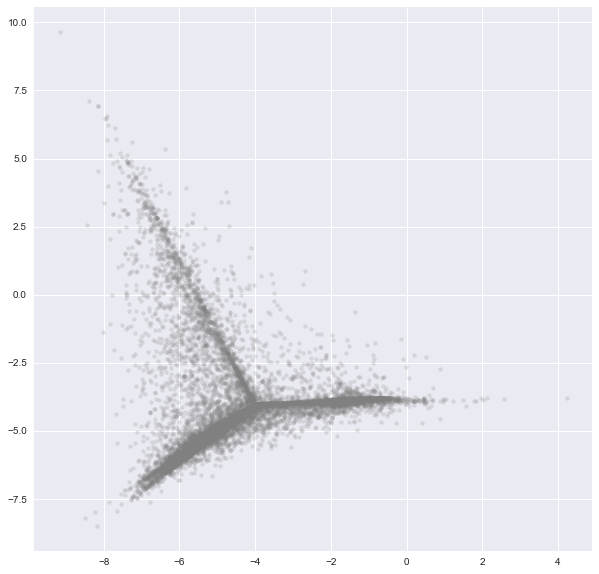

In [38]:
plt.figure(figsize=(10,10))

# ---- plot all dots
plt.scatter(X_fischerLDA[:,0], X_fischerLDA[:,1], s=20, c="gray", alpha=0.2, linewidths=0)

# ---- plot the years avg

YEARS = range(1960,2016)
for i, year in enumerate(YEARS):
    palette = sns.color_palette(palette="RdBu", n_colors=len(YEARS))
    indices = data_en.iloc[not_trash_abstracts_idx].year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]]  
    plt.scatter(np.mean(X_tmp[:,0]), np.mean(X_tmp[:,1]), c=palette[i], s=len(indices))
    
# ---- plot the topic centroids
plt.scatter(X_fischerLDA[a:b,0], X_fischerLDA[a:b,1], c=np.array(current_palette)[range(0,b-a)], marker="*", s=800, alpha=.5)
    

plt.yscale("symlog")
plt.xscale("symlog", basex=50)
plt.show()

In [75]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import Range1d, HoverTool, ColumnDataSource, Text
import bokeh.io
bokeh.io.reset_output() # ultra important not to overcrowd the export
output_notebook(bokeh.resources.INLINE)  # enable bokeh to run inline in Jupyter

Loading BokehJS ...

In [40]:
output_notebook()

Loading BokehJS ...

In [272]:
def visualize_per_year_bokeh(year):

    TOOLS="pan,wheel_zoom,box_select,lasso_select,reset"
    
    
    # create the figure
    p = figure(tools=TOOLS, plot_width=600, plot_height=600, min_border=10, min_border_left=50,
               toolbar_location="above", x_axis_location=None, y_axis_location=None,
               x_range=Range1d(-10, 10), y_range=Range1d(-10,12))
    
    p.background_fill_color = "#fafafa"
    
    # slice data for current year
    indices = data_en.iloc[not_trash_abstracts_idx].year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]]

    

    # ---- plot all dots
    p.scatter(X_tmp[:,0], X_tmp[:,1], size=5, color="#dddddd", alpha=1, line_width=0)


    # ---- plot the years avg
    p.scatter(np.mean(X_tmp[:,0]), np.mean(X_tmp[:,1]), color="red", size=20, alpha=.7, marker="*")

    # ---- plot the topic centroids
    p.scatter(X_fischerLDA[a:b,0], X_fischerLDA[a:b,1], color=np.array(current_palette)[range(0,b-a)], marker="diamond", size=20, alpha=.5)

    return p

In [51]:
import random
raw_data = pd.read_csv("../data/patentsCH_EN.csv", sep=";",
                  index_col=0,
                  names=["id", "abstract", "year"])[1:].drop_duplicates()
raw_data.year = pd.to_numeric(raw_data.year)
raw_data = raw_data[raw_data.year <= 2018]
random.seed(777)
N_RANDOM=25000
u = range(len(raw_data))
v = random.sample(u, N_RANDOM)
raw_data = raw_data.iloc[v]
raw_data = raw_data.iloc[not_trash_abstracts_idx]
print(len(raw_data))

14178


In [94]:
raw_data.to_csv("../data/raw_data.csv")

In [96]:
np.save("X_fischerLDA", X_fischerLDA)

In [105]:
def visualize_per_year_bokeh2(year):

    TOOLS="resize,crosshair,pan,wheel_zoom,box_zoom,reset,tap,previewsave,box_select, hover, undo, redo"
    
    
    # create the figure
    p = figure(tools=TOOLS, plot_width=700, plot_height=700, min_border=10, min_border_left=50,
               toolbar_location="above", x_axis_location=None, y_axis_location=None,
               x_range=Range1d(-10, 6), y_range=Range1d(-9,11),
              title= "Patents abstracts applied in Switzerland in {y}\n".format(y=year))
    
    p.background_fill_color = "#fafafa"
    
    # ### Add the background year text
    # We add this first so it is below all the other glyphs
    text_source = ColumnDataSource({'year': ['%s' % year]})
    text = Text(x=-4, y=0, text='year', text_font_size='120pt', text_color='#EEEEEE')
    p.add_glyph(text_source, text)
    
    # slice data for current year
    indices = raw_data.year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]]

    # ---- plot all dots
    source = ColumnDataSource(data=dict(
            x=X_tmp[:,0],
            y=X_tmp[:,1],
            qualifier=["patent abstract"]*X_tmp.shape[0],
            content=[s[:80] for s in raw_data[raw_data.year == year].abstract.values]
        ))
    p.scatter('x', 'y', source=source, color="#dddddd", legend="patent abstracts in "+str(year))

    # ---- plot the years avg
    source = ColumnDataSource(data=dict(
            x=[np.mean(X_tmp[:,0])],
            y=[np.mean(X_tmp[:,1])],
            qualifier=["year's average patent"],
            content=[""]
        ))
    p.scatter('x', 'y', source=source, color="red", size=20, alpha=.5, marker="circle_x", legend="year's average patent")

    # ---- plot the topic centroids
    source = ColumnDataSource(data=dict(
            x=X_fischerLDA[a:b,0],
            y=X_fischerLDA[a:b,1],
            qualifier=["topic center"]*(b-a),
            content=list(to_theme.values())
        ))
    
    #p.scatter('x', 'y', source=source, color=np.array(current_palette)[range(0,b-a)], 
    #          size=20, alpha=.7, marker="diamond", legend="topic center")
    p.scatter('x', 'y', source=source, color="green", 
              size=20, alpha=.7, marker="cross", legend="topic center")
    
    hover = p.select_one(HoverTool)
    hover.point_policy = "follow_mouse"
    hover.tooltips = [
        ("Type", "@qualifier"),
        ("Content", "@content")
    ]
    

    return show(p)

In [106]:
interact(visualize_per_year_bokeh2, year=(1970,2015,1))

<function __main__.visualize_per_year_bokeh2>

In [208]:
def build_distance_matrix(data, mu):
    """build a distance matrix.
    return
        distance matrix:
            row of the matrix represents the data point,
            column of the matrix represents the k-th cluster.
    """
    distance_list = []
    num_cluster, _ = mu.shape
    for k_th in range(num_cluster):
        sum_squares = np.sum(np.square(data - mu[k_th, :]), axis=1)
        distance_list.append(sum_squares)
    return np.array(distance_list).T

In [209]:
def visualize_topic_hist(year):
    TOOLS="pan,wheel_zoom,box_select,lasso_select,reset"
    
    # slice data for current year
    indices = data_en.iloc[not_trash_abstracts_idx].year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]] 
    
    
    # create the figure
    #fig = figure(tools=TOOLS, plot_width=400, plot_height=400, min_border=10, min_border_left=50,
    #           toolbar_location="above", x_axis_location=None, y_axis_location=None,
    #           x_range=Range1d(-7, 5), y_range=Range1d(-6, 5))
    
    #fig.background_fill_color = "#fafafa"
    
    distance_matrix = build_distance_matrix(X_tmp[:,:], X_fischerLDA[a:b,:])
    assignments = [color2id[current_palette[n]] for n in np.argmin(distance_matrix, axis=1)]
    df = pd.DataFrame(assignments, columns=["assignments"])
    dict_ = []
    from bokeh.charts import Histogram
    histo = Histogram(df, values='assignments',
                 plot_width=600, plot_height=600, bins=4)
    
    return histo
    

In [210]:
def dash_(year):
    from bokeh.layouts import gridplot
    from bokeh.layouts import row
    topic_scatter = visualize_per_year_bokeh(year)
    topic_hist = visualize_topic_hist(year)
    
    print(type(topic_scatter), type(topic_hist))
    
    #grid = gridplot([[topic_scatter, topic_hist]])
    #return show(grid)
    
    
    return show(row(topic_scatter, topic_hist))

In [331]:
interact(dash_, year=(1970,2015,1))

<class 'bokeh.plotting.figure.Figure'> <class 'bokeh.charts.chart.Chart'>


AttributeError: 'function' object has no attribute 'references'

<function __main__.dash_>

In [ ]:
source = ColumnDataSource(data=dict(
            x=X_tsne[ranges[d][0]:ranges[d][1], 0],
            y=X_tsne[ranges[d][0]:ranges[d][1], 1],
            qualifier=[d]*(ranges[d][1]-ranges[d][0]),
            content=titles_dict[d]
        ))
p.scatter('x', 'y', source=source, color=colors_dict[d], legend=d)

In [293]:
def visualize_per_year2(year):
    plt.figure(figsize=(8,8))

    # slice data
    
    indices = data_en.year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]]  
    
    # plot points
    
    for i in range(X_tmp.shape[0]):
        plt.scatter(X_tmp[i,0], X_tmp[i,1], s=20, c="gray", alpha=0.2, linewidths=0)
    
    # plot mean
    
    plt.scatter(np.mean(X_tmp[:,0]), np.mean(X_tmp[:,1]), c="red", s=len(indices))

    # plot the topic centroids

        # first define markers labels

    markers=[]
    for m in range(X.shape[1]):
        if to_theme[m]:
            #markers.append('${n}$'.format(n=to_theme[m]))
            markers.append('p')
        else:
            markers.append("None")
        # now plot 

    for i, centroid in enumerate(range(a,b)):
        plt.scatter(X_fischerLDA[centroid,0], 
                    X_fischerLDA[centroid,1], 
                    c="black", 
                    marker=markers[i], 
                    s=200, alpha=.5)
    plt.xscale("symlog")
    plt.yscale("symlog")
    plt.show()

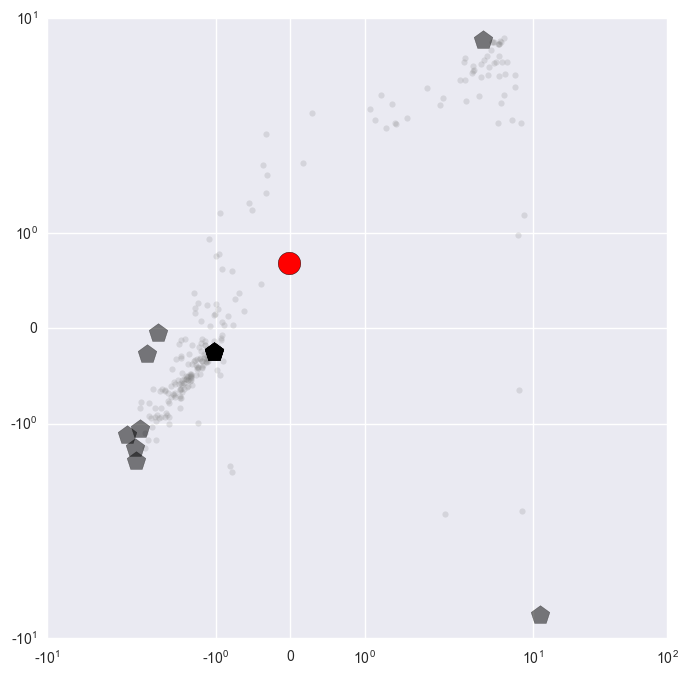

In [294]:
interact(visualize_per_year2, year=(1970,2015,1))

["mechanics", "optics", "thermodynamics"]:
        return "red"
    elif theme in ["electricity", "information"]:
        return "blue"
    elif theme in ["materials", "life science"]:
        return "green"
    elif theme in ["chemistry", "organic chemistry", "liquid chemistry"]:
        return "gray"
    elif theme in ["transport", "supply chain"]:

In [251]:
def visualize_per_year(year):
    
    # plot the abstracts projection only for asked year
    #indices = data_en.year.isin([y for y in range(1900,year)])
    indices = data_en.year.isin([year])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_fischerLDA[[indices]]    
    
    # define colors
    #colors = [current_palette[a] for a in y[indices]]
    colors = y
    
    plt.figure(figsize=(8,8))
    for i in range(X_tmp.shape[0]):
        plt.scatter(X_tmp[i,0], X_tmp[i,1], c=colors[i])
    
    # plot the topic centroids
    #plt.scatter(X_fischerLDA[a:b,0], X_fischerLDA[a:b,1], c=current_palette, marker="p", 
    #            linewidths=20, edgecolors="r", alpha=.8)

    # plot the topic centroids
    for i, centroid in enumerate(range(a,b)):
        plt.scatter(X_fischerLDA[centroid,0], 
                    X_fischerLDA[centroid,1], 
                    c="black", 
                    marker=markers[i], 
                    s=10000, alpha=.5)
    # doing the legend
    import matplotlib.patches as mpatches
    patches = []
    #for i,c in enumerate(current_palette):
    #    patches.append(mpatches.Patch(color=c, label=centroid_labels[i]))
    #plt.legend(handles=patches, loc=3)
    
    plt.show()
    plt.savefig('video/img'+str(year)+'.png')
    
    

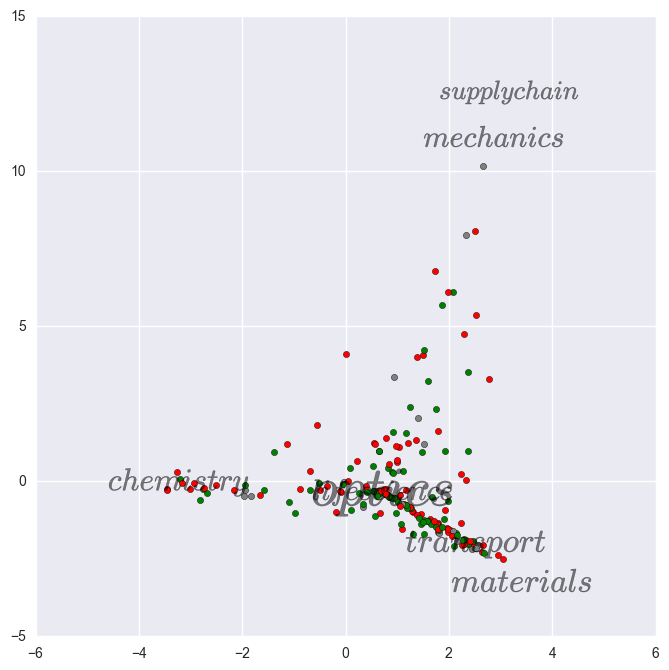

In [252]:
interact(visualize_per_year, year=(1950,2015,1))

In [264]:
from bokeh.sampledata.gapminder import fertility, life_expectancy, population, regions
fertility.head()

,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,7.671,7.671,7.671,7.671,7.671,7.671,7.671,7.671,7.671,7.671,...,7.136,6.930,6.702,6.456,6.196,5.928,5.659,5.395,5.141,4.900
Albania,5.711,5.594,5.483,5.376,5.268,5.160,5.050,4.933,4.809,4.677,...,2.004,1.919,1.849,1.796,1.761,1.744,1.741,1.748,1.760,1.771
Algeria,7.653,7.655,7.657,7.658,7.657,7.652,7.641,7.622,7.591,7.548,...,2.448,2.507,2.580,2.656,2.725,2.781,2.817,2.829,2.820,2.795
American Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [267]:
regions.head()

,Group,ID
Country,,
Angola,Sub-Saharan Africa,AO
Benin,Sub-Saharan Africa,BJ
Botswana,Sub-Saharan Africa,BW
Burkina Faso,Sub-Saharan Africa,BF
Burundi,Sub-Saharan Africa,BI


In [34]:
def visualize_fischer_lda():
    
    # define fischer_lda
    #http://stackoverflow.com/questions/23277958/how-to-run-and-interpret-fishers-linear-discriminant-analysis-from-scikit-learn
    from sklearn.lda import LDA as fischerLDA
    fischerLDA = fischerLDA(n_components=2)

    # y must be the assignments. Suppose we say it is the topic that has maximum value in the distribution
    y = list(np.argmax(X, axis=1))
    X_fischerLDA = fischerLDA.fit_transform(X, y)
    
    # define colors
    colors = [current_palette[c] for c in y]
    
    # define bounds 
    a = X.shape[0] - N_TOPICS
    b = X.shape[0]
    
    # plot the abstracts projection
    plt.figure(figsize=(15,15))
    for i in range(len(data_en)):
        plt.scatter(X_fischerLDA[i,0], X_fischerLDA[i,1], c=colors[i])

    # plot the topic centroids
    plt.scatter(X_fischerLDA[a:b,0], X_fischerLDA[a:b,1], c=current_palette, marker="p", 
                linewidths=20, edgecolors="r", alpha=.8)

    # doing the legend
    import matplotlib.patches as mpatches
    patches = []
    for i,c in enumerate(current_palette):
        patches.append(mpatches.Patch(color=c, label=centroid_labels[i]))
    plt.legend(handles=patches, loc=3)
    
    plt.show()

/Users/arnaudmiribel/anaconda/envs/ada/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


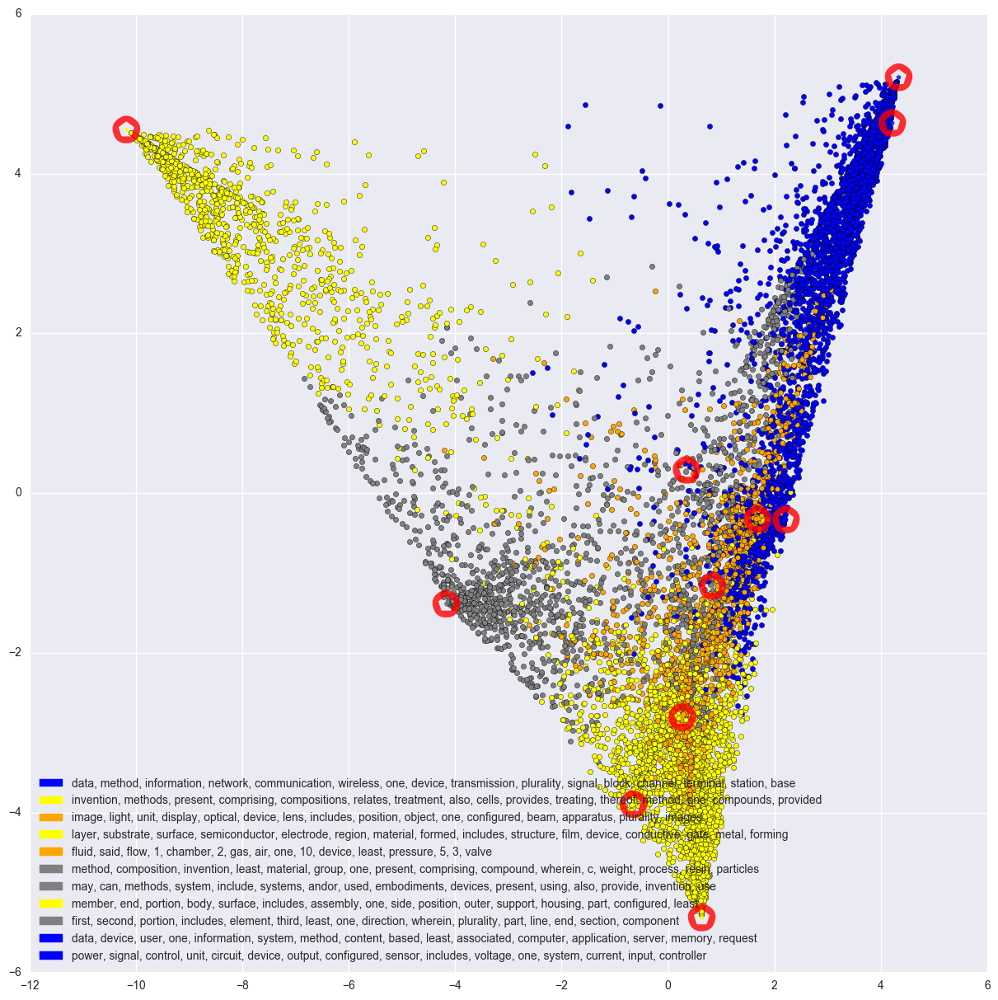

In [37]:
visualize_fischer_lda()

# Try to guess classes

In [296]:
def build_distance_matrix(data, mu):
    """build a distance matrix.
    return
        distance matrix:
            row of the matrix represents the data point,
            column of the matrix represents the k-th cluster.
    """
    distance_list = []
    num_cluster, _ = mu.shape
    for k_th in range(num_cluster):
        sum_squares = np.sum(np.square(data - mu[k_th, :]), axis=1)
        distance_list.append(sum_squares)
    return np.array(distance_list).T

In [305]:
def visualize_tsne():
    
    # reduce dimension using TSNE
    from sklearn.decomposition import PCA
    pca = PCA(n_components=5)
    X_pca = pca.fit_transform(X)
    X_tsne = TSNE(learning_rate=100).fit_transform(X)
    
    # define bounds 
    a = X.shape[0] - len(nonnull_idx)
    b = X.shape[0]
    
    # infer assignments (1 execution of k-means with centroids)
    distance_matrix = build_distance_matrix(X_tsne[0:len(data_en),:], X_tsne[a:b,:])
    losses = np.min(distance_matrix, axis=1)
    assignments = np.argmin(distance_matrix, axis=1)
    
    # take assignments from topic distribution
    assignments = list(np.argmax(X, axis=1))
    
    # define colors
    colors = [current_palette[a] for a in assignments]
    colors = [current_palette[i] for i in y]
    
    # scatter points
    plt.figure(figsize=(15,15))
    for i in range(len(data_en)):
        plt.scatter(X_tsne[i,0], X_tsne[i,1], c=colors[i])


    plt.scatter(X_tsne[a:b,0], X_tsne[a:b,1], c=current_palette, marker="p", 
                linewidths=20, edgecolors="r", alpha=.8)

    # doing the legend
    import matplotlib.patches as mpatches
    patches = []
    for i,c in enumerate(current_palette):
        patches.append(mpatches.Patch(color=c, label=centroid_labels[i]))
    plt.legend(handles=patches)
    plt.show()


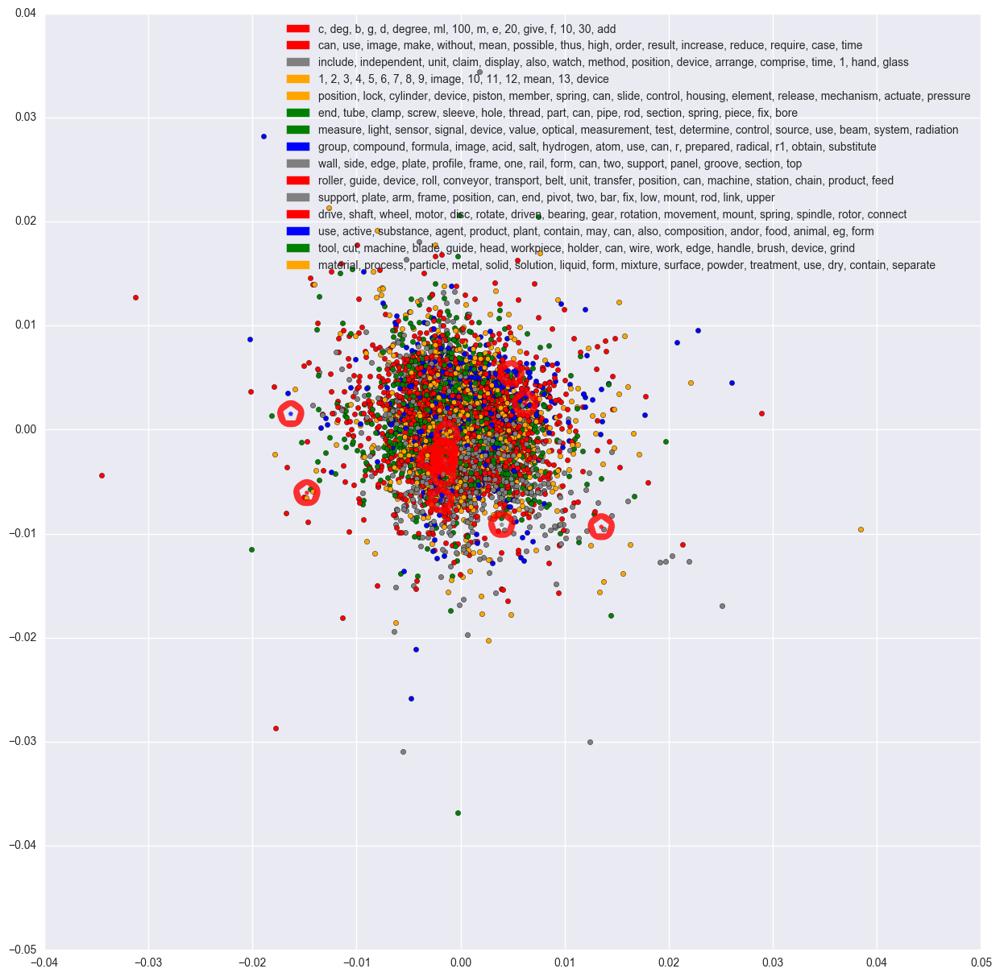

In [306]:
visualize_tsne()

In [308]:
def visualize_pca(year):
    
    # reduce dimension using TSNE
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    # plot the abstracts projection only for asked year
    indices = data_en.year.isin([y for y in range(1900,year)])
    indices = [i for i,boo in enumerate(indices) if boo]
    X_tmp = X_pca[[indices]]    
    
    # define bounds 
    a = X.shape[0] - N_TOPICS
    b = X.shape[0]
    
    # infer assignments (1 execution of k-means with centroids)
    distance_matrix = build_distance_matrix(X_pca[0:len(data_en),:], X_pca[a:b,:])
    losses = np.min(distance_matrix, axis=1)
    assignments = np.argmin(distance_matrix, axis=1)
    # take assignments from topic distribution
    assignments = np.array(np.argmax(X, axis=1))
    
    
    # define colors
    colors = [current_palette[a] for a in assignments[indices]]
    colors = [current_palette[i] for i in y]
    # scatter points
    plt.figure(figsize=(10,10))
    
    proportions=dict()
    for ass in set(assignments):
        proportions[ass]=len(assignments[assignments == ass]) / len(assignments)
                             
    import operator
    sorted_proportions = sorted(proportions.items(), key=operator.itemgetter(1))
                             
    for i in range(X_tmp.shape[0]):
        prop = len(assignments[assignments == assignments[i]]) / len(assignments)
        prop = .1
        if sorted_proportions[assignments[i]] == sorted_proportions[-1]:
            prop=1                            
        plt.scatter(X_tmp[i,0], X_tmp[i,1], c=colors[i], linewidths=0, alpha=prop)

    # centroids
    plt.scatter(X_pca[a:b,0], X_pca[a:b,1], c=current_palette, marker="p", 
                linewidths=10, edgecolors="r", alpha=.5)

    # doing the legend
    import matplotlib.patches as mpatches
    patches = []
    for i,c in enumerate(current_palette):
        patches.append(mpatches.Patch(color=c, label=centroid_labels[i]))
    #plt.legend(handles=patches)
    plt.savefig("video/pca/"+str(year)+".png")
    #plt.show()


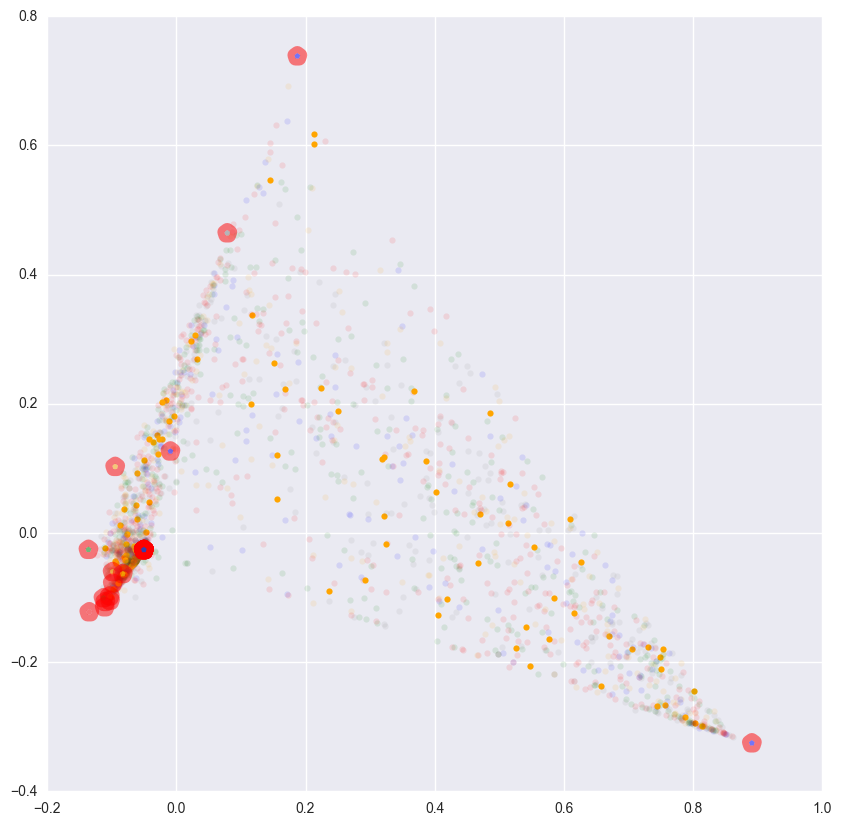

In [309]:
visualize_pca(1975)

In [69]:
# reduce dimension using TSNE
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
# plot the abstracts projection only for asked year
indices = data_en.year.isin([y for y in range(1900,2015)])
indices = [i for i,boo in enumerate(indices) if boo]
X_tmp = X_pca[[indices]]  

In [77]:
X_tmp.shape

(9974, 2)

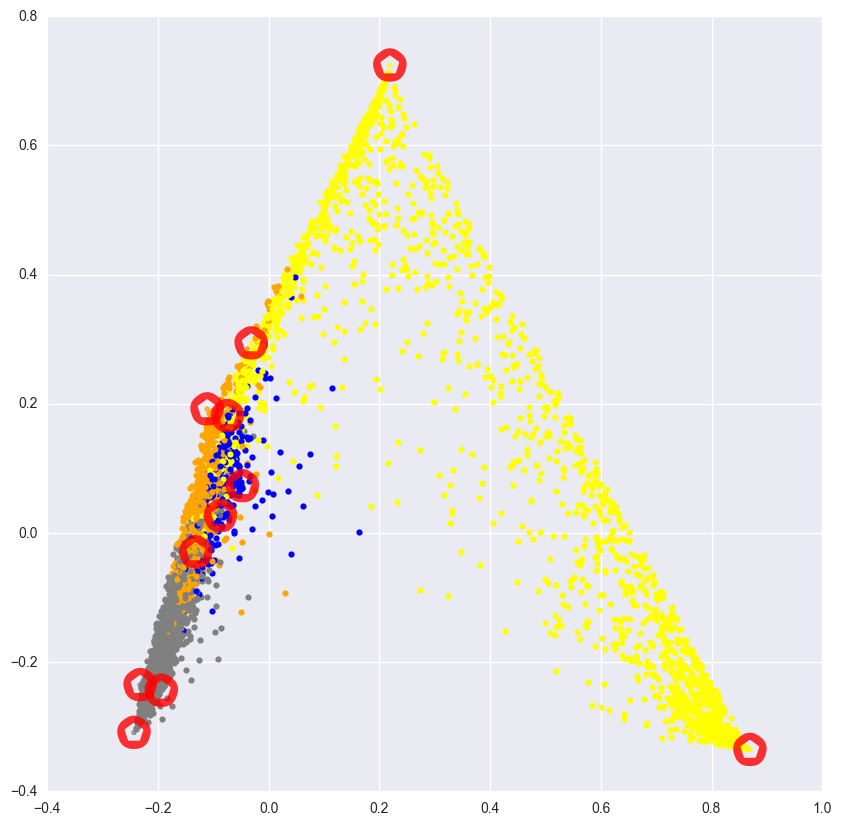

In [91]:
visualize_pca(1980)

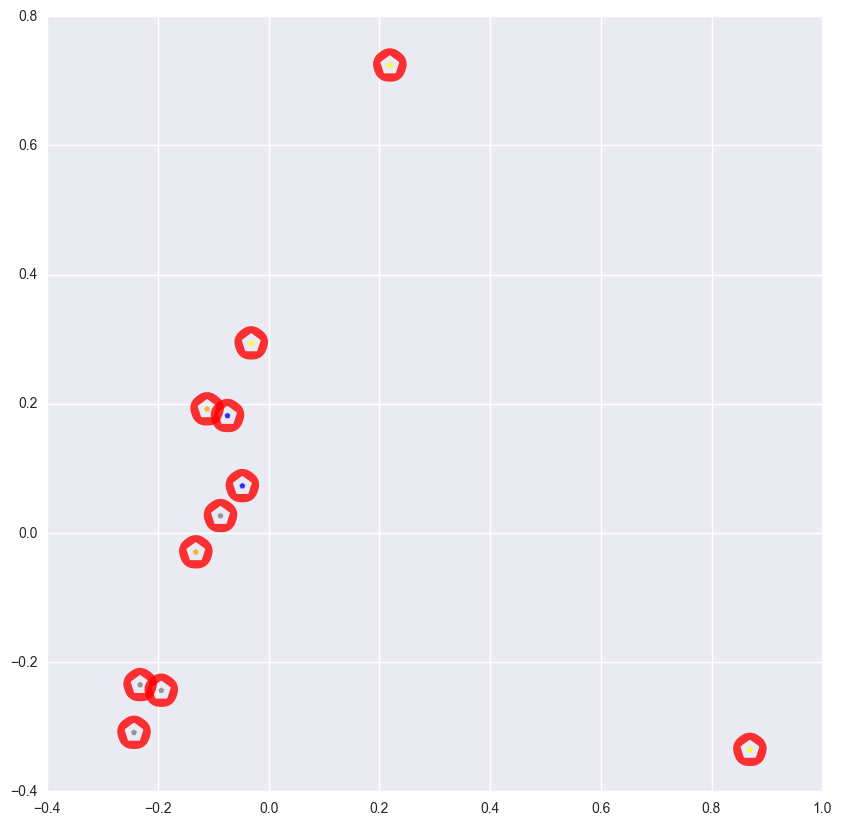

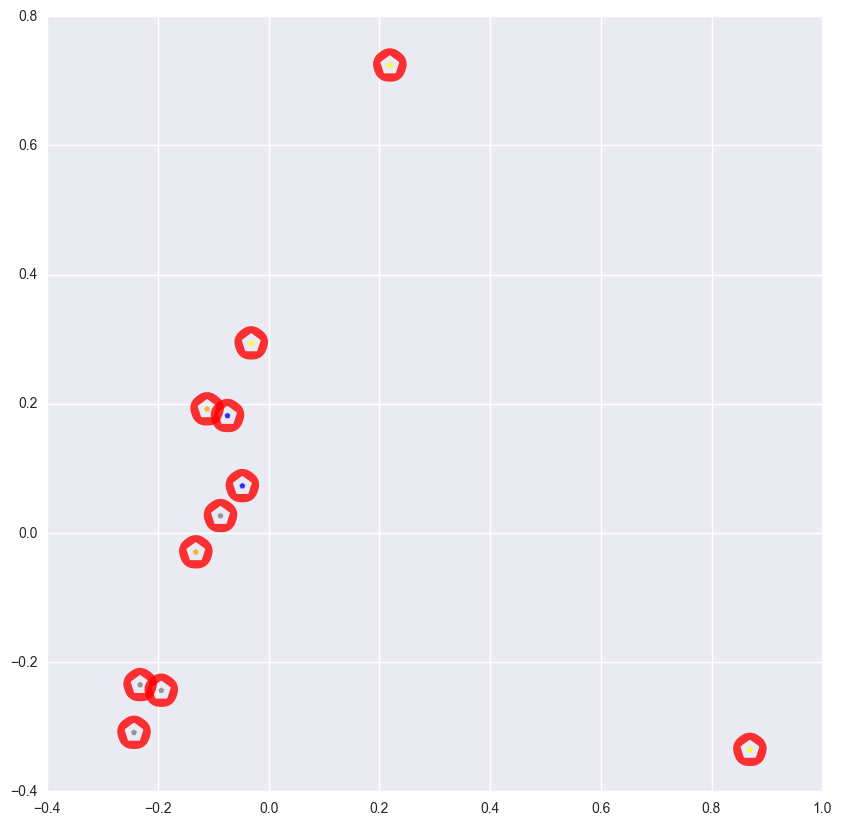

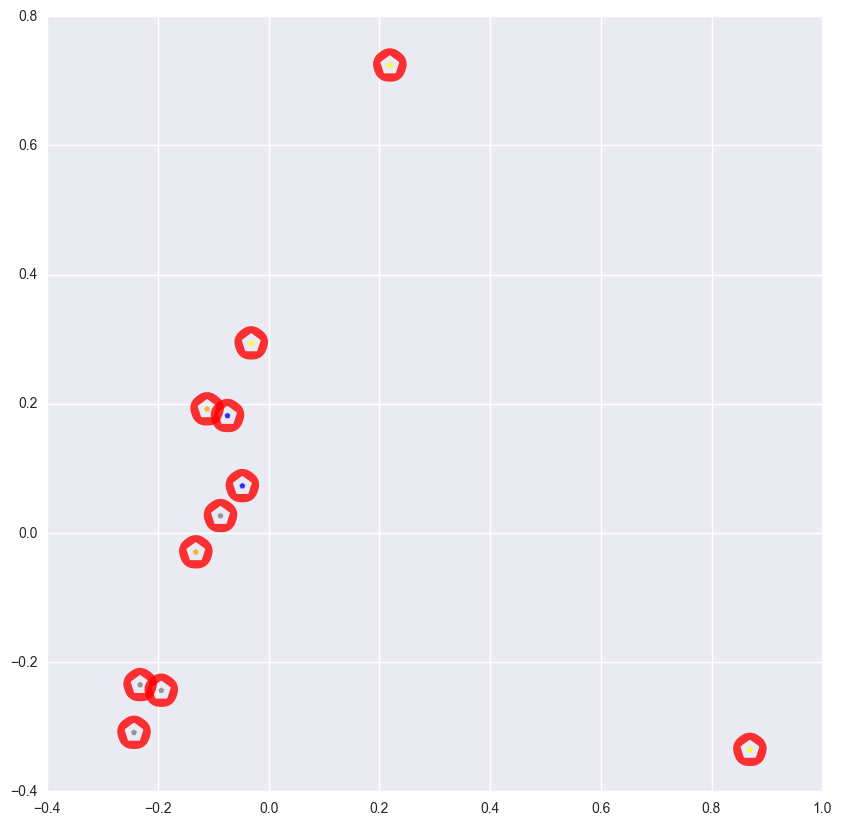

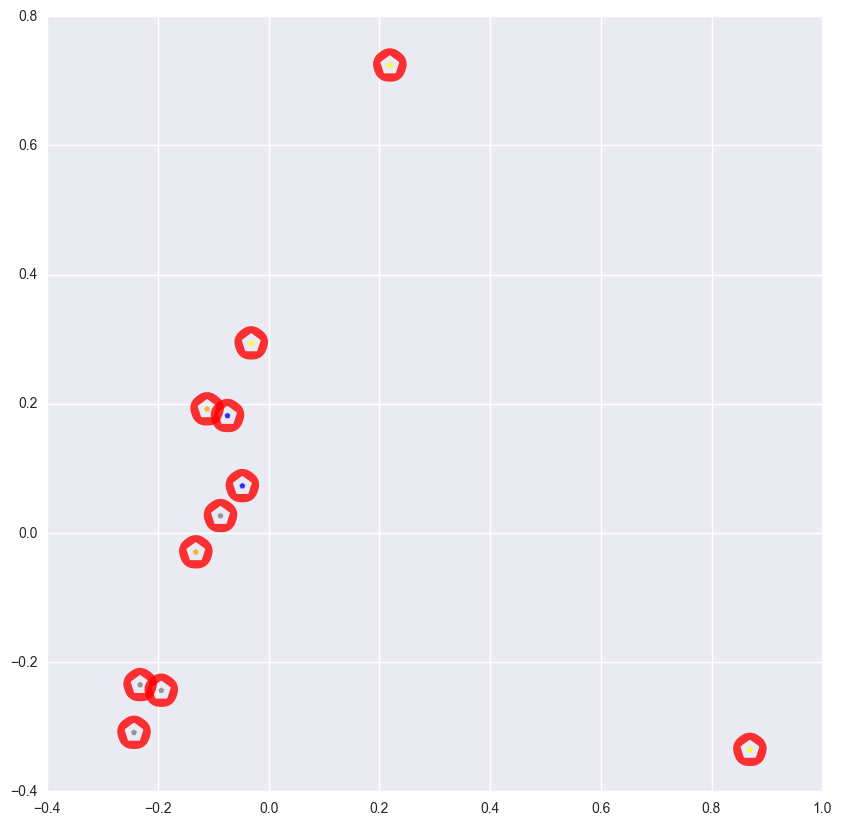

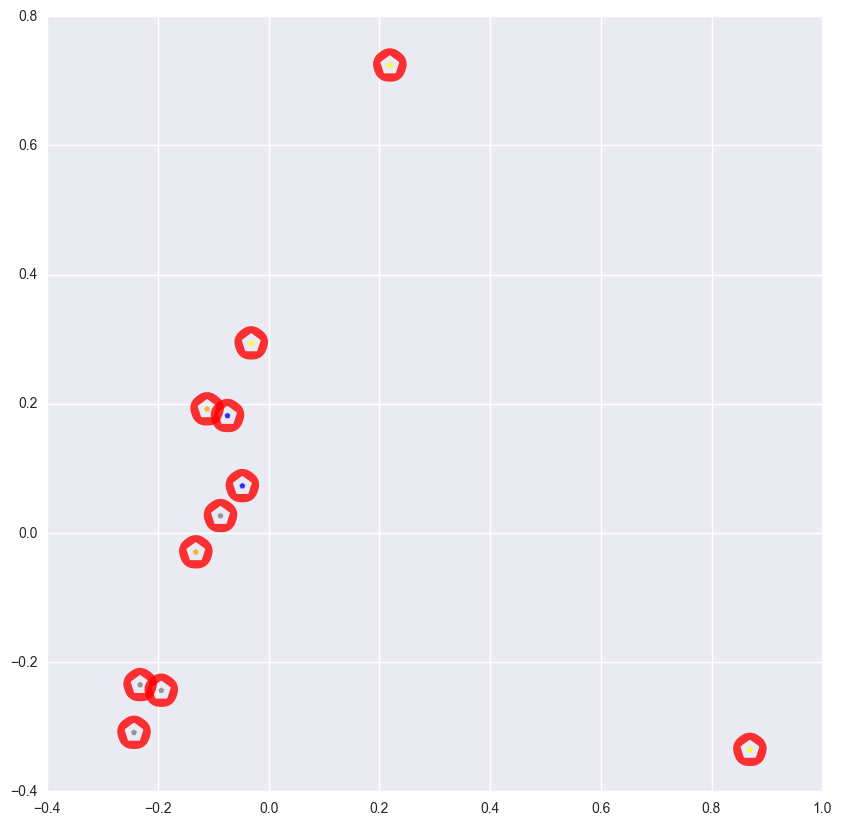

...

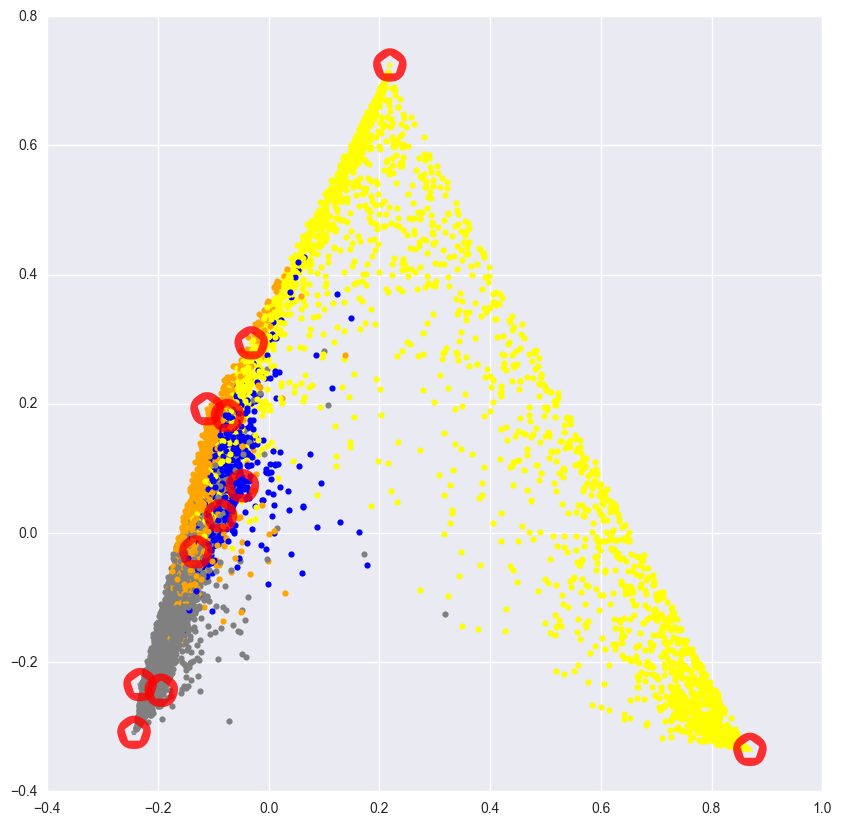

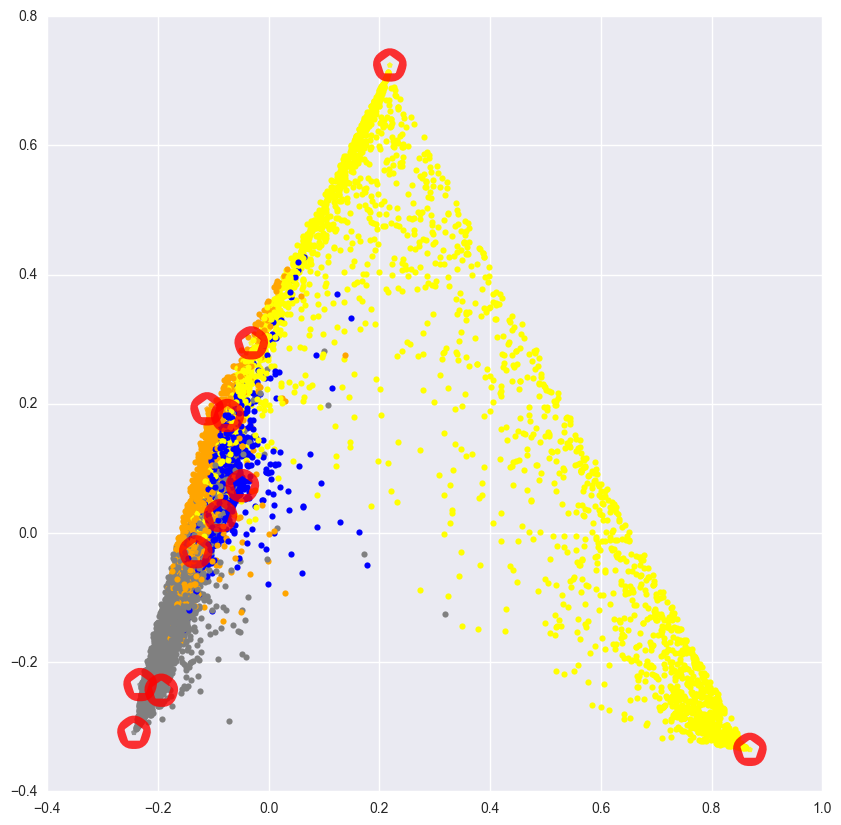

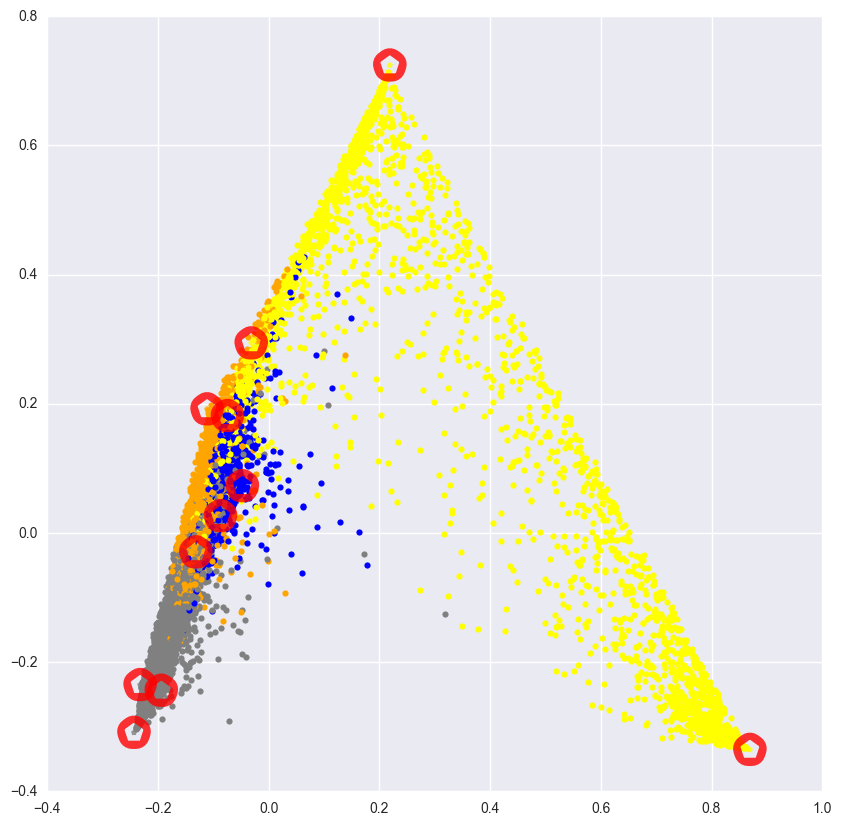

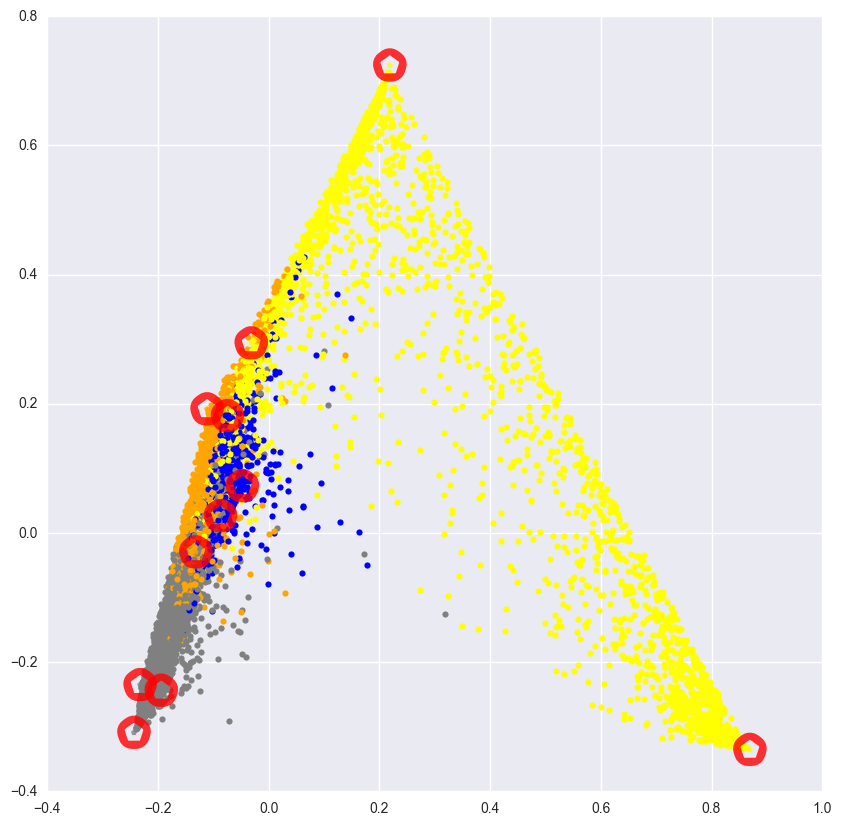

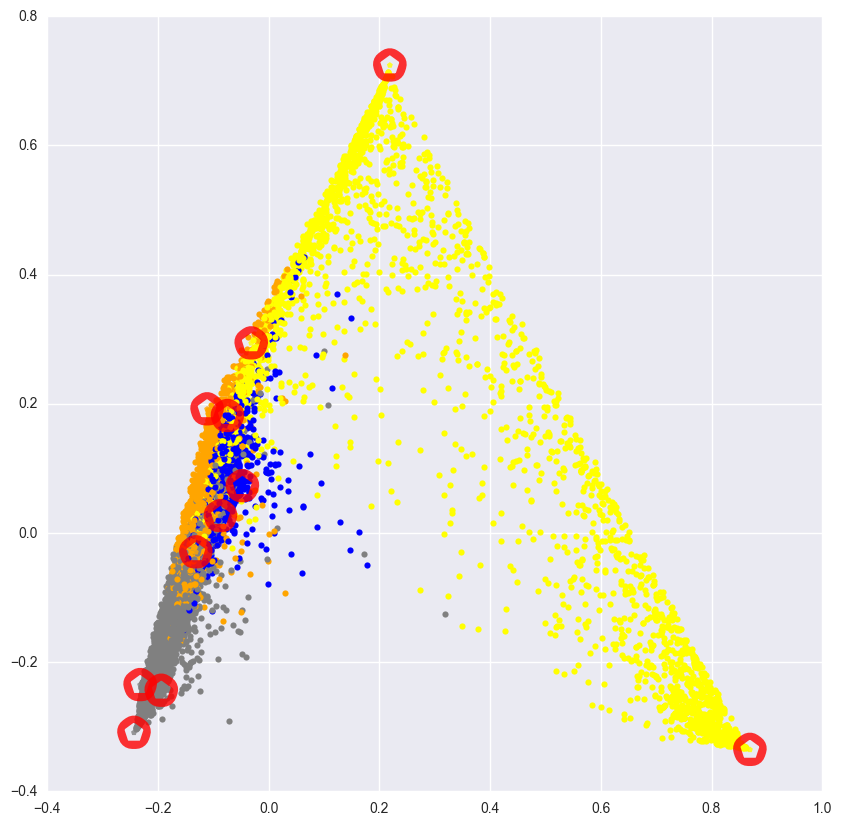

In [92]:
for y in range(1900,2015):
    visualize_pca(y)

In [93]:
import imageio
from os import listdir
from os.path import isfile, join
images = []


filenames = [f for f in listdir("./video/pca/") if isfile(join("./video/pca/", f))]
for filename in filenames:
    images.append(imageio.imread("./video/pca/"+filename))
imageio.mimsave('./movie_cumulative_pca.gif', images)

# Bokeh trials

In [18]:
output_notebook()

Loading BokehJS ...

In [96]:
p.plot_height=800
p.plot_width=800
p.title.text = "What are the topics U.S Presidency candidates talk about ?"
p.title.text_font_size = "20pt"
# Turn off tick labels
p.axis.major_label_text_font_size = '0pt'  
# Turn off tick marks 
p.axis.major_tick_line_color = None  # turn off major ticks
p.axis[0].ticker.num_minor_ticks = 0  # turn off minor ticks
p.axis[1].ticker.num_minor_ticks = 0

# remove grids
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

#legend
p.legend.orientation = "vertical"
p.legend.location = "bottom_right"
p.legend.background_fill_alpha = 1
p.legend.label_text_font = "Avenir"

show(p)

TypeError: 'NoneType' object is not iterable

In [68]:
from bokeh.embed import file_html
from bokeh.resources import CDN

html = file_html(p, CDN, "US Candidates topics")
with open("plot_US.html", "w") as f:
    f.write(html)

TypeError: 'NoneType' object is not iterable

In [17]:
bokeh.io.reset_output() # ultra important not to overcrowd the export
output_notebook(bokeh.resources.INLINE)  # enable bokeh to run inline in Jupyter
TOOLS="resize,crosshair,pan,wheel_zoom,box_zoom,reset,tap,previewsave,box_select,poly_select, hover, undo, redo"

# Create figure

p = figure(tools=TOOLS,plot_width=600, plot_height=300)

# Scatter data from politicians
source = ColumnDataSource(
                data = dict(
                        x=X_tsne[:,0], 
                        y=X_tsne[:,1],
                        qualifier=["Abstract"]*X_tsne.shape[0],
                        content=titles.append(centroid_labels))
                )

p.scatter('x', 'y', source=source, color="black")

# Scatter topics

a = X.shape[0] - N_TOPICS
b = X.shape[0]

source = ColumnDataSource(data=dict(
    x = X_tsne[a:b,0],
    y = X_tsne[a:b,1],
    qualifier=["Topic"]*(b-a),
    content = centroid_labels
    ))

p.scatter('x', 'y', source=source, color="red", marker="diamond", size=30, legend="Topic")
hover = p.select_one(HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = [
    ("Type", "@qualifier"),
    ("Content", "@content")
]

Loading BokehJS ...

In [16]:
titles = [" ".join(t) for t in titles]